In [0]:
!pip install torchvision
!pip instal Pillow

ERROR: unknown command "instal" - maybe you meant "install"


In [0]:
import torch
import torch.optim as optim
from torchvision import models,transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

In [0]:
model= models.vgg19(pretrained=True).features
for param in model.parameters():
  param.requires_grad_(False)

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:09<00:00, 62.4MB/s]


In [0]:
device=torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPoo

In [0]:
def load_img(img_path,max_size=400,shape=None):
#   img=Image.open(path).convert("BGR")
#   trans=transforms.Compose([transforms.Resize(size),transforms.ToTensor(),transforms.Normalize((0.5,), (0.5,))])
  image = Image.open(img_path).convert('RGB')
  if max(image.size) > max_size:
      size = max_size
  else:
      size = max(image.size)

  if shape is not None:
      size = shape

  in_transform = transforms.Compose([
                      transforms.Resize(size),
                      transforms.ToTensor(),
                      transforms.Normalize((0.5, 0.5, 0.5), 
                                           (0.5, 0.5, 0.5))])

  image = in_transform(image).unsqueeze(0)

  return image
def process_img(tensor):
  image=tensor.to('cpu').clone().detach()
#   print(image.shape)
  image=image.numpy().squeeze()
  image=image.transpose(1,2,0)
  image=image * np.array((0.5,0.5,0.5)) +np.array((0.5,0.5,0.5))
  image=image.clip(0,1)
  return image

In [0]:
curr_content = load_img("/content/City.jpg").to(device)
curr_style = load_img("/content/StarryNight.jpg",shape=curr_content.shape[-2:]).to(device)

(-0.5, 599.5, 399.5, -0.5)

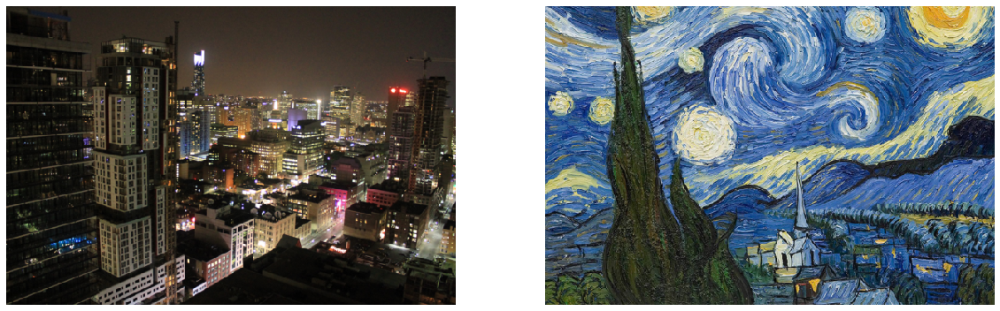

In [0]:
fig,(ax1,ax2)=plt.subplots(1,2 ,figsize=(20,10))
ax1.imshow(process_img(curr_content))
ax1.axis('off')
ax2.imshow(process_img(curr_style))
ax2.axis('off')

In [0]:
def extract(image,model):
  layers={'0':'conv1_1',
          '5':'conv2_1',
         '10':'conv3_1',
         '19':'conv4_1',
         '21':'conv4_2',
         '28':"conv5_1"}
  features={}
  for name,layer in model._modules.items():
    image=layer(image)
    if name in layers:
      features[layers[name]]=image
  return features
# layers = {'0': 'conv1_1',
#               '5': 'conv2_1', 
#               '10': 'conv3_1', 
#               '19': 'conv4_1',
#               '21': 'conv4_2',  # Content Extraction
#               '28': 'conv5_1'}
        
#     features = {}
 
#     for name, layer in model._modules.items():
#         image = layer(image)
#         if name in layers:
#             features[layers[name]] = image
            
#     return features

In [0]:
content_feats = extract(curr_content,model)
style_feats=extract(curr_style,model)

In [0]:
def gram_matrix(tensor):
  _, d, h, w = tensor.size()
  tensor = tensor.view(d, h * w)
  gram = torch.mm(tensor, tensor.t())
  return gram
style_grams = {layer: gram_matrix(style_feats[layer]) for layer in style_feats}

In [0]:
style_weights = {'conv1_1': 1.,
                 'conv2_1': 0.75,
                 'conv3_1': 0.2,
                 'conv4_1': 0.2,
                 'conv5_1': 0.2}
 
content_weight = 1  # alpha
style_weight = 1e6  # beta
target = curr_content.clone().requires_grad_(True).to(device)

Total loss:  2887664.25
Iteration:  300


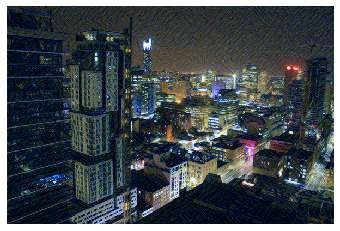

Total loss:  950006.625
Iteration:  600


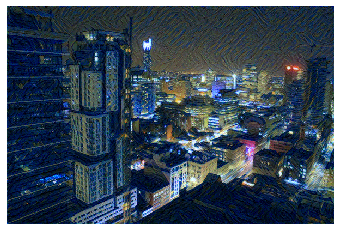

Total loss:  658550.875
Iteration:  900


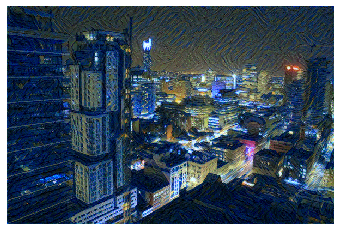

Total loss:  510592.5
Iteration:  1200


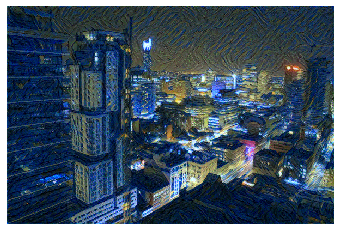

Total loss:  400863.40625
Iteration:  1500


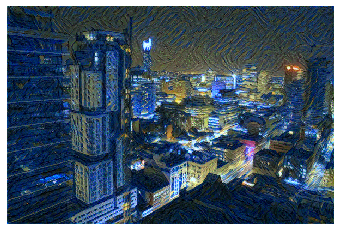

Total loss:  315029.40625
Iteration:  1800


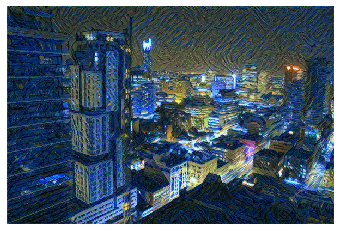

Total loss:  246972.734375
Iteration:  2100


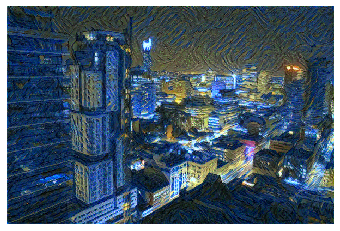

Total loss:  192675.453125
Iteration:  2400


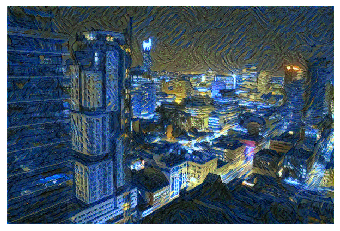

Total loss:  149467.9375
Iteration:  2700


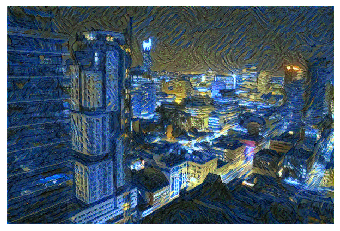

Total loss:  115344.9375
Iteration:  3000


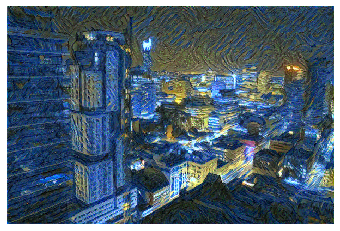

Total loss:  88749.34375
Iteration:  3300


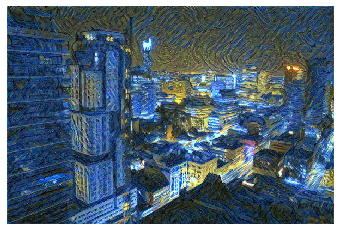

Total loss:  68382.90625
Iteration:  3600


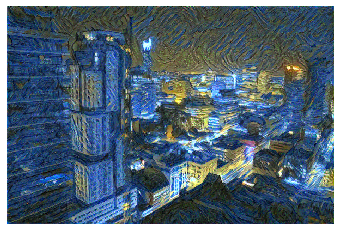

Total loss:  53073.21875
Iteration:  3900


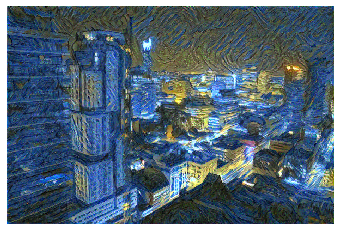

Total loss:  41791.0078125
Iteration:  4200


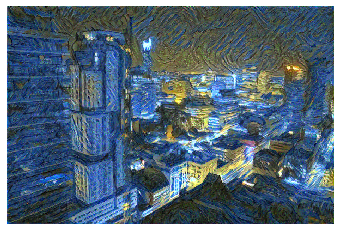

Total loss:  33619.515625
Iteration:  4500


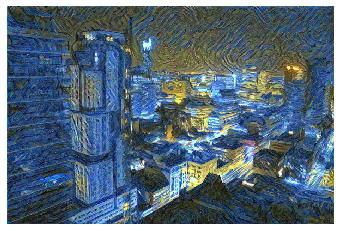

Total loss:  27743.046875
Iteration:  4800


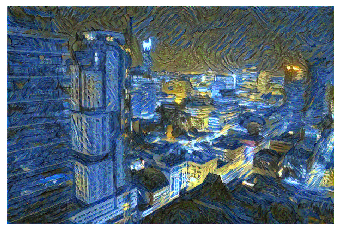

Total loss:  23501.51953125
Iteration:  5100


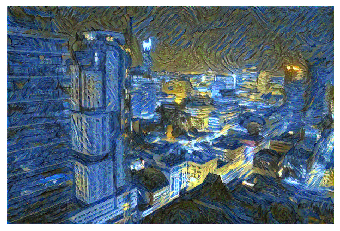

Total loss:  20492.453125
Iteration:  5400


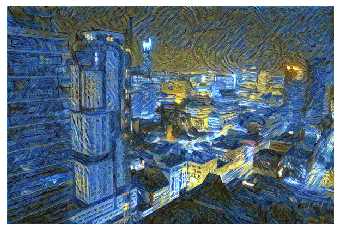

Total loss:  18161.8828125
Iteration:  5700


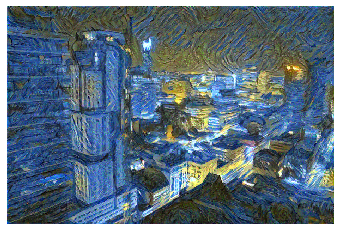

Total loss:  16749.896484375
Iteration:  6000


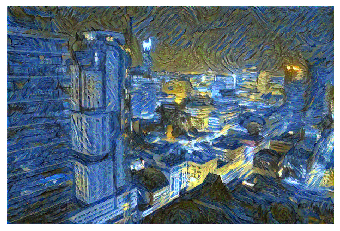

Total loss:  15223.0087890625
Iteration:  6300


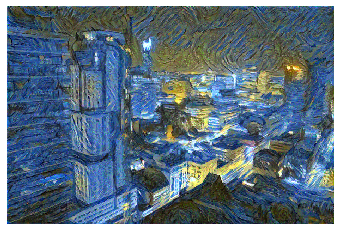

Total loss:  14235.04296875
Iteration:  6600


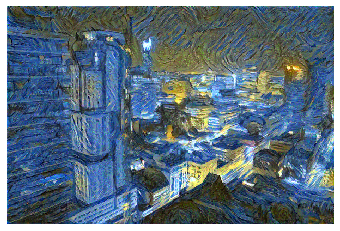

Total loss:  13363.591796875
Iteration:  6900


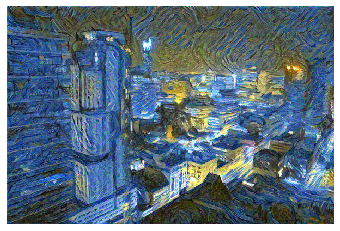

Total loss:  12714.369140625
Iteration:  7200


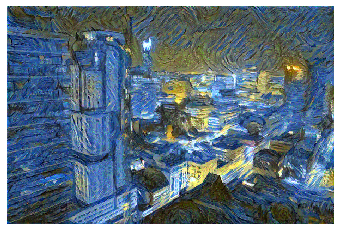

Total loss:  12248.0244140625
Iteration:  7500


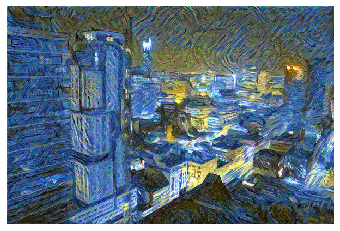

Total loss:  12240.4521484375
Iteration:  7800


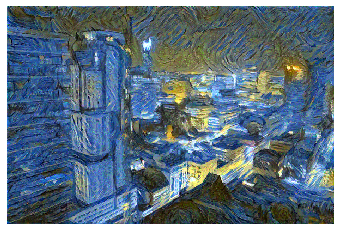

Total loss:  11274.2744140625
Iteration:  8100


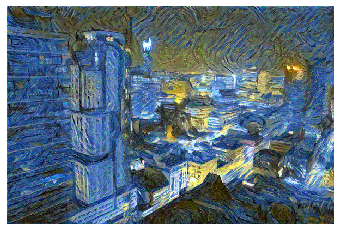

Total loss:  10905.69140625
Iteration:  8400


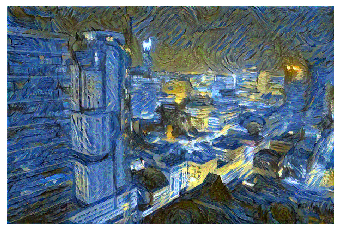

Total loss:  10626.85546875
Iteration:  8700


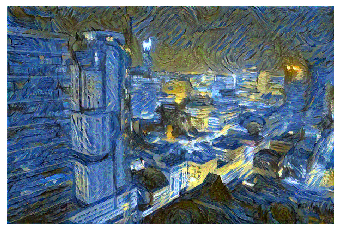

Total loss:  10380.7294921875
Iteration:  9000


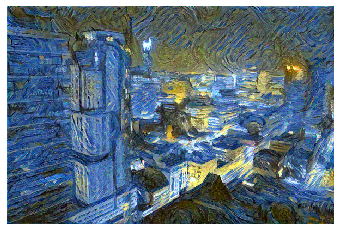

Total loss:  10177.5732421875
Iteration:  9300


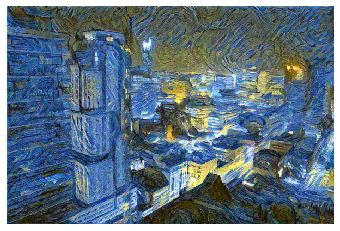

Total loss:  9899.6435546875
Iteration:  9600


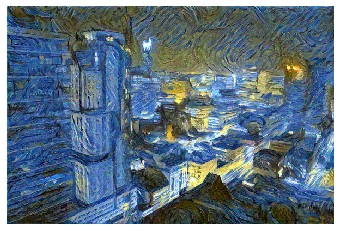

Total loss:  9831.1650390625
Iteration:  9900


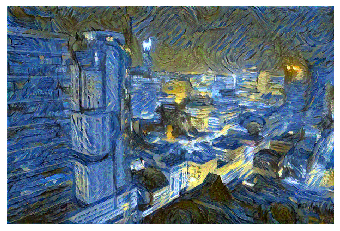

Total loss:  9621.2822265625
Iteration:  10200


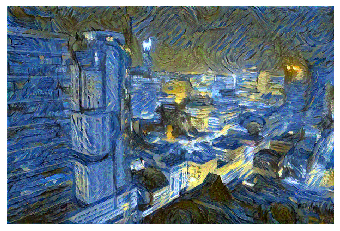

Total loss:  9592.755859375
Iteration:  10500


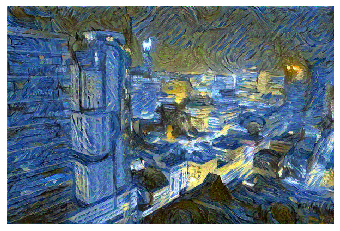

Total loss:  11933.439453125
Iteration:  10800


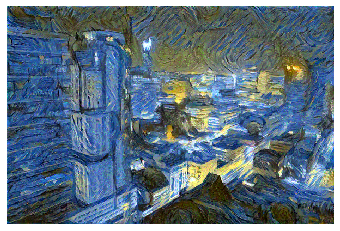

Total loss:  9419.87890625
Iteration:  11100


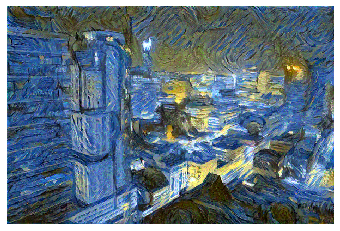

Total loss:  9014.70703125
Iteration:  11400


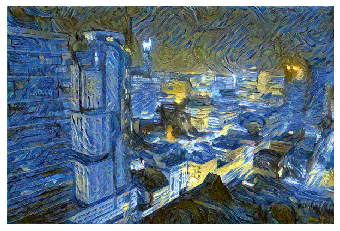

Total loss:  9491.0107421875
Iteration:  11700


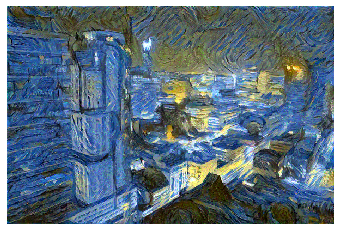

Total loss:  8770.037109375
Iteration:  12000


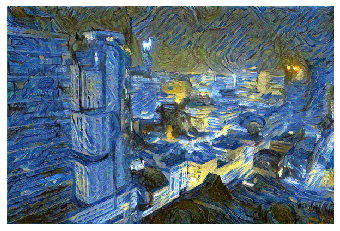

Total loss:  9027.984375
Iteration:  12300


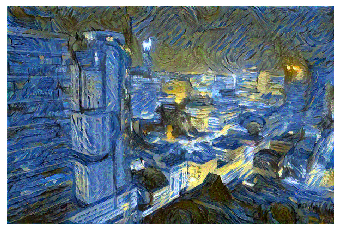

Total loss:  8786.51171875
Iteration:  12600


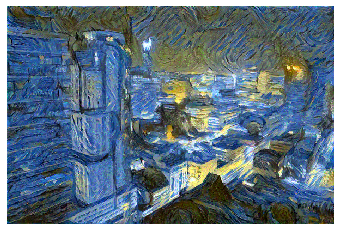

Total loss:  8608.875
Iteration:  12900


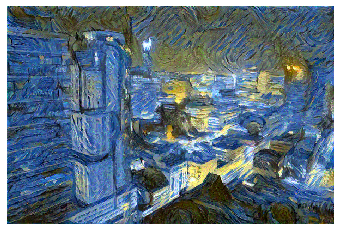

Total loss:  8470.8642578125
Iteration:  13200


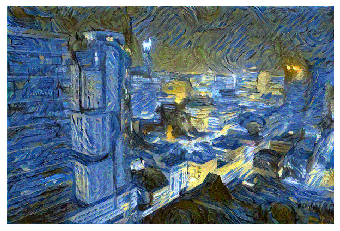

Total loss:  8493.1044921875
Iteration:  13500


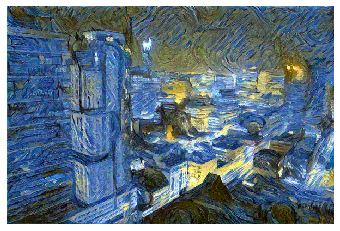

Total loss:  8316.22265625
Iteration:  13800


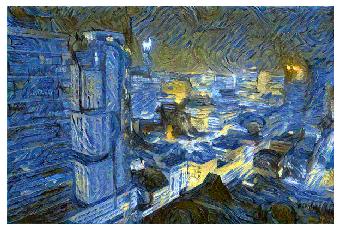

Total loss:  9371.9951171875
Iteration:  14100


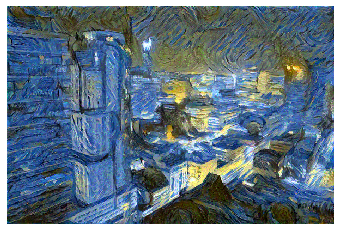

Total loss:  8175.5576171875
Iteration:  14400


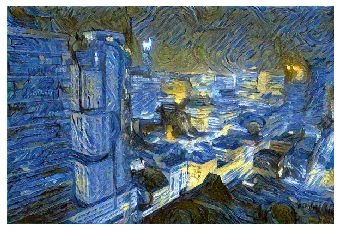

Total loss:  8192.427734375
Iteration:  14700


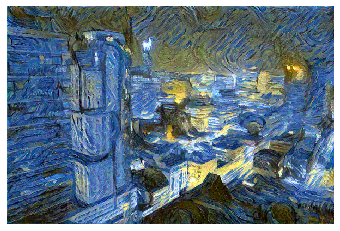

Total loss:  8033.943359375
Iteration:  15000


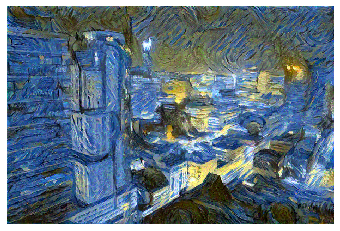

In [0]:
ep = 300
optimizer = optim.Adam([target], lr=0.003)
steps = 15000
 
height, width, channels = process_img(target).shape
image_array = np.empty(shape=(300, height, width, channels))
capture_frame = steps/300
counter = 0
for ii in range(1, steps+1):
  target_features = extract(target, model)
  content_loss = torch.mean((target_features['conv4_2'] - content_feats['conv4_2'])**2)
  style_loss = 0
  
  for layer in style_weights:
    target_feature = target_features[layer]
    target_gram = gram_matrix(target_feature)
    style_gram = style_grams[layer]
    layer_style_loss = style_weights[layer] * torch.mean((target_gram - style_gram)**2)
    _, d, h, w = target_feature.shape
    style_loss += layer_style_loss / (d * h * w)
  
  total_loss = content_weight * content_loss + style_weight * style_loss
  
  optimizer.zero_grad()
  total_loss.backward()
  optimizer.step()
  
  if  ii % ep == 0:
    print('Total loss: ', total_loss.item())
    print('Iteration: ', ii)
    plt.imshow(process_img(target))
    plt.axis("off")
    plt.show()
    
  if ii % capture_frame == 0:
    image_array[counter] = process_img(target)
    counter = counter + 1

In [0]:
import cv2 
 
frame_height, frame_width, _ = process_img(target).shape
vid = cv2.VideoWriter('output.mp4', cv2.VideoWriter_fourcc(*'XVID'), 30, (frame_width, frame_height))
 
for i in range(0, 300):
  img = image_array[i]
  img = img*255
  img = np.array(img, dtype = np.uint8)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  vid.write(img)
 
vid.release()